In [1]:

import umap

import scanpy as sc
import anndata
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib as mpl
from sklearn.metrics import adjusted_rand_score as ARI
from sklearn.metrics import adjusted_mutual_info_score as AMI

from scipy import sparse
from matplotlib import rcParams
rcParams['pdf.fonttype'] = 42 # enables correct plotting of text
rcParams['figure.figsize'] = (8,8)
import seaborn as sns
from scipy import sparse

sc.settings.verbosity =0


import harmonypy as hm
import matplotlib.pyplot as plt
import pandas as pd
import scanpy as sc


In [2]:
l1_colors = {
'ATL': '#1f77b4',
  'PT_VCAM1': '#c5b0d5',
 'CNT': '#ff7f0e',
 'DCT': '#279e68',
  'DCT1': '#279e68',
 'DCT2': '#ffb500',
 'DTL': '#d62728',
 'EC': '#aa40fc',
 'ENDO': '#aa40fc',
 'FIB': '#8c564b',
 'IC': '#e377c2',
 'ICA': '#e377c2',
 'ICB': '#7b4f4b',
 'IMM': '#b5bd61',
 'LEUK': '#b5bd61',
 'NEU': '#17becf',
 'PC': '#aec7e8',
 'PEC': '#17becf',
 'POD': '#98df8a',
 'PODO': '#98df8a',
'PT': '#ff9896',
 'PapE': '#c5b0d5',
 'TAL': '#c49c94',
'MES': '#f7b6d2',
 'VSM/P': '#f7b6d2','Unclassified':'#d3d3d3'}

In [3]:
l3_colors = {
'ATL': '#ffff00',
 'B': '#1ce6ff',
 'C-TAL': '#ff34ff',
 'PC': '#aec7e8',
 'CCD-IC-A': '#ff4a46',
 'CCD-PC': '#008941',
 'CNT': '#006fa6',
 'CNT-IC-A': '#a30059',
 'CNT-PC': '#ffdbe5',
 'DCT1': '#7a4900',
 'DCT2': '#0000a6',
 'DTL': '#63ffac',
 'EC-AEA': '#b79762',
 'EC-AVR': '#004d43',
 'EC-DVR': '#8fb0ff',
 'EC-GC': '#997d87',
 'EC-LYM': '#5a0007',
 'EC-PTC': '#809693',
 'FIB': '#6a3a4c',
 'IC-B': '#1b4400',
 'IMCD': '#4fc601',
 'M-FIB': '#3b5dff',
 'M-TAL': '#4a3b53',
 'MAC-M2': '#ff2f80',
 'MAST': '#61615a',
 'MC': '#ba0900',
 'MD': '#6b7900',
 'MDC': '#00c2a0',
 'MYOF': '#ffaa92',
 'N': '#ff90c9',
 'NEU': '#b903aa',
 'NKC/T': '#d16100',
 'OMCD-IC-A': '#ddefff',
 'OMCD-PC': '#000035',
 'PEC': '#7b4f4b',
 'PL': '#a1c299',
 'POD': '#300018',
 'PT-S1/2': '#0aa6d8',
 'PT-S3': '#013349',
 'PapE': '#00846f',
 'REN': '#372101',
 'T': '#ffb500',
 'VSMC': '#c2ffed',
 'VSMC/P': '#a079bf',
 'aFIB': '#cc0744',
 'aPT': '#c0b9b2',
 'aTAL1': '#c2ff99',
 'aTAL1_0':'#04823b',
 'aTAL1_1':'#83f536',
 'aTAL1_2':'#62d996',
 'aTAL2': '#001e09',
 'cDC': '#00489c',
 'cycCNT': '#6f0062',
 'cycDCT': '#0cbd66',
 'cycEC': '#eec3ff',
 'cycMNP': '#456d75',
 'cycMYOF': '#b77b68',
 'cycNKC/T': '#7a87a1',
 'cycPT': '#788d66',
 'dC-IC-A': '#885578',
 'dC-TAL': '#fad09f',
 'dCNT': '#ff8a9a',
 'dDCT': '#d157a0',
 'dEC': '#bec459',
 'dEC-PTC': '#456648',
 'dFIB': '#0086ed',
 'dIMCD': '#886f4c',
 'dM-FIB': '#34362d',
 'dM-TAL': '#b4a8bd',
 'dOMCD-PC': '#00a6aa',
 'dPT': '#452c2c',
 'dVSMC': '#636375',
 'ncMON': '#a3c8c9',
 'pDC': '#ff913f',
 'tPC-IC': '#938a81','Unclassified':'#d3d3d3'}

# RNA- INTEGRATION

In [ ]:
adata = sc.read('objects/RNA_STWG_final.h5ad')

# RECLUSTERING TAL1 CELLS

In [28]:
adata = adata[adata.obs['Deepscore_HCA_l1_Clean'].isin(['TAL'])].copy()

sc.pp.neighbors(adata, use_rep='scVI', n_neighbors=10)
sc.tl.umap(adata, spread = 1.5, min_dist = 0.1)


In [85]:
sc.tl.leiden(adata, resolution=0.5)

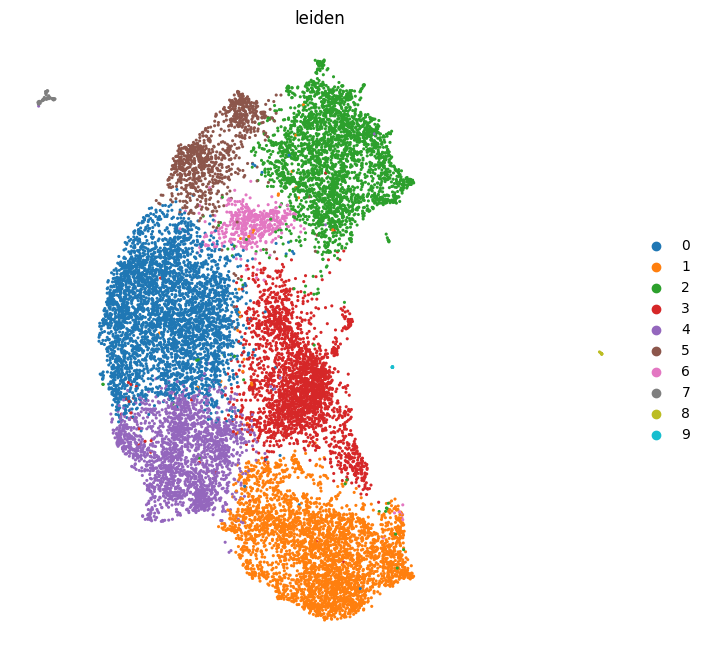

In [ ]:
import scanpy as sc
sc.pl.umap(adata, color = ['leiden'], ncols=1, size = 20, frameon=False, show=False)
plt.savefig('figures/TAL1/clusters.png', dpi=300, bbox_inches='tight')

/tmp/ipykernel_10615/1812704225.py:2: FutureWarning: In the future, the default backend for leiden will be igraph instead of leidenalg.

 To achieve the future defaults please pass: flavor="igraph" and n_iterations=2.  directed must also be False to work with igraph's implementation.
  sc.tl.leiden(adata_, resolution=0.2)
/home/macera/.conda/envs/scanpy_basic/lib/python3.9/site-packages/scanpy/tools/_leiden.py:199: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  adata.obs[key_added] = pd.Categorical(


<AxesSubplot: title={'center': 'leiden'}, xlabel='UMAP1', ylabel='UMAP2'>

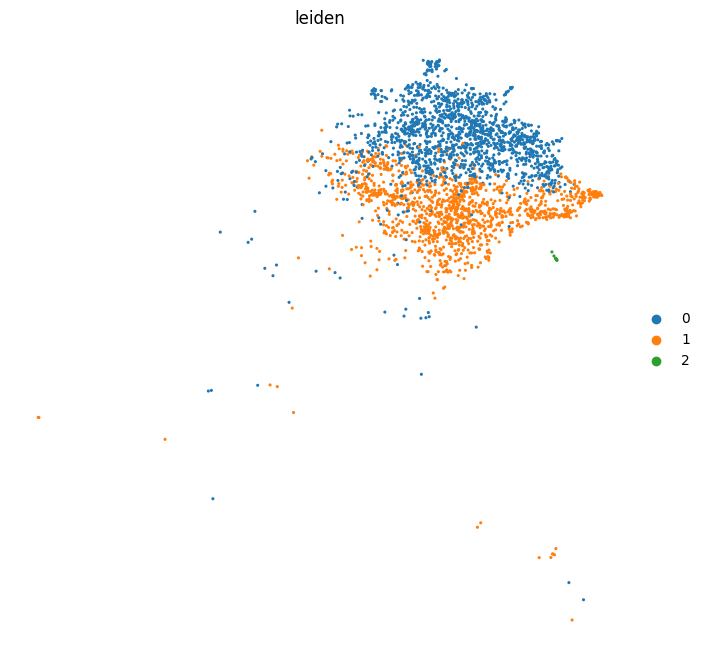

In [11]:
adata_ = adata[adata.obs['leiden'].isin(['2'])]
sc.tl.leiden(adata_, resolution=0.2)
sc.pl.umap(adata_, color = ['leiden'], ncols=1, size = 20, frameon=False, show=False)


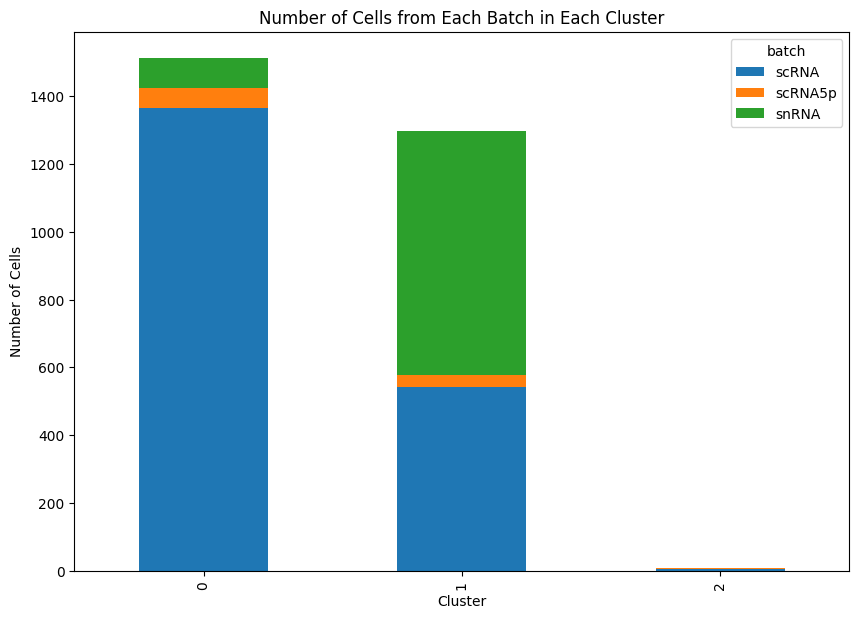

In [12]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Assuming 'leiden' and 'batch' are stored in adata.obs
cluster_data = adata_.obs[['leiden', 'batch']]

# Create a contingency table to count the number of cells in each cluster and batch
cluster_counts = pd.crosstab(cluster_data['leiden'], cluster_data['batch'])

# Create a bar plot
cluster_counts.plot(kind='bar', stacked=True, figsize=(10, 7))

# Set the title and labels
plt.title('Number of Cells from Each Batch in Each Cluster')
plt.xlabel('Cluster')
plt.ylabel('Number of Cells')
plt.savefig('figures/TAL1/Barplot_cluster_2reclustered_x_batch.png', dpi=300, bbox_inches='tight')

# Show the plot
plt.show()


In [13]:
adata.obs['leiden'] = adata.obs['leiden'].tolist()
adata.obs.loc[adata_.obs.index,'leiden'] = ['2_'+i for i in adata_.obs['leiden']]

In [14]:
adata.obs['leiden_r2'] = adata.obs['leiden'].copy()

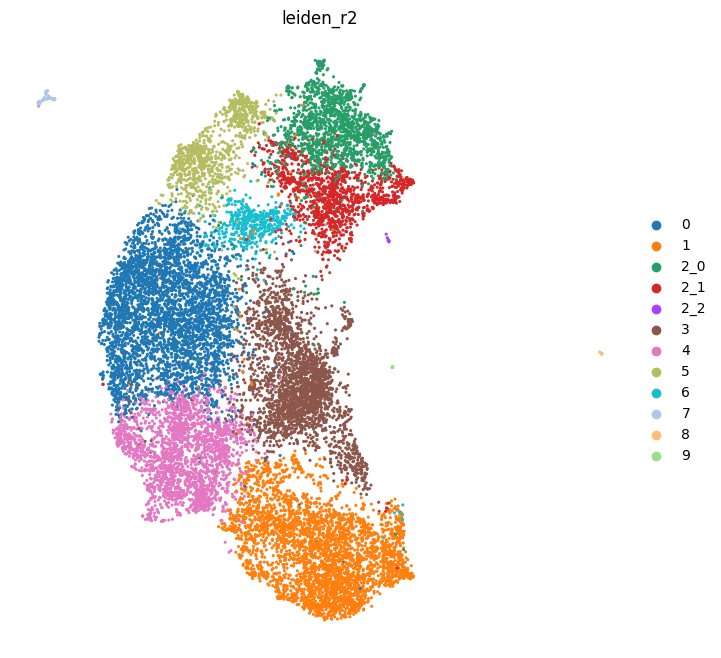

In [20]:
import scanpy as sc
sc.pl.umap(adata, color = ['leiden_r2'], ncols=1, size = 20, frameon=False, show=False)
plt.savefig('figures/TAL1/clusters_recluster2.png', dpi=300, bbox_inches='tight')

In [23]:
adata.obs['Manual_Annotation'] = ''
adata.obs.loc[adata.obs.index[adata.obs['leiden_r2']=='0'],'Manual_Annotation'] = 'C-TAL'
adata.obs.loc[adata.obs.index[adata.obs['leiden_r2']=='1'],'Manual_Annotation'] = 'C-TAL'
adata.obs.loc[adata.obs.index[adata.obs['leiden_r2']=='2_0'],'Manual_Annotation'] = 'aTAL1_0'
adata.obs.loc[adata.obs.index[adata.obs['leiden_r2']=='2_1'],'Manual_Annotation'] = 'aTAL1_1'
adata.obs.loc[adata.obs.index[adata.obs['leiden_r2']=='2_2'],'Manual_Annotation'] = 'aTAL1_1'
adata.obs.loc[adata.obs.index[adata.obs['leiden_r2']=='3'],'Manual_Annotation'] = 'C-TAL'
adata.obs.loc[adata.obs.index[adata.obs['leiden_r2']=='4'],'Manual_Annotation'] = 'C-TAL'
adata.obs.loc[adata.obs.index[adata.obs['leiden_r2']=='5'],'Manual_Annotation'] = 'MD'
adata.obs.loc[adata.obs.index[adata.obs['leiden_r2']=='6'],'Manual_Annotation'] = 'aTAL1_2'
adata.obs.loc[adata.obs.index[adata.obs['leiden_r2']=='7'],'Manual_Annotation'] = 'aTAL1_0'
adata.obs.loc[adata.obs.index[adata.obs['leiden_r2']=='8'],'Manual_Annotation'] = 'aTAL1_2'
adata.obs.loc[adata.obs.index[adata.obs['leiden_r2']=='9'],'Manual_Annotation'] = 'aTAL1_2'


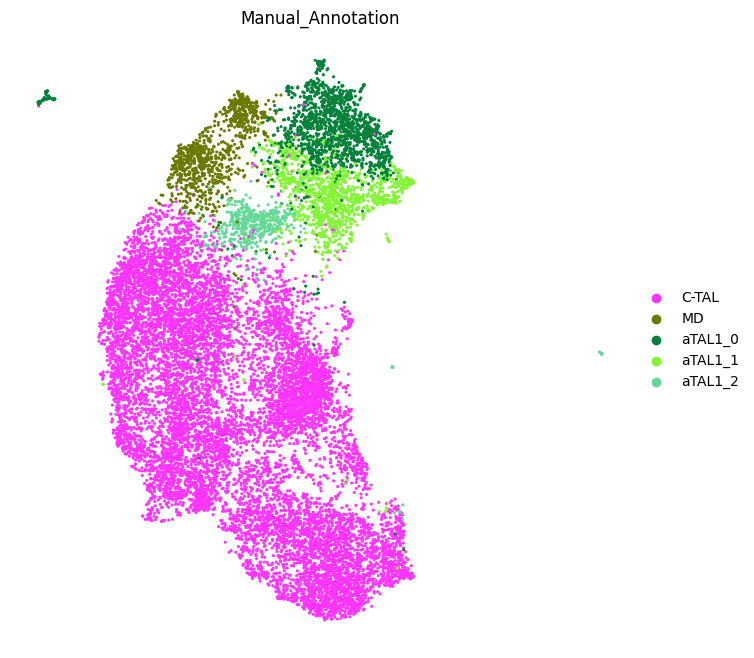

In [42]:
import scanpy as sc
sc.pl.umap(adata, color = ['Manual_Annotation'], ncols=1, size = 20, frameon=False, show=False, palette = l3_colors)
plt.savefig('figures/TAL1/clusters.png', dpi=300, bbox_inches='tight')

/home/macera/.conda/envs/scanpy_basic/lib/python3.9/site-packages/scanpy/plotting/_utils.py:465: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[value_to_plot + "_colors"] = colors_list
/home/macera/.conda/envs/scanpy_basic/lib/python3.9/site-packages/scanpy/plotting/_utils.py:465: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[value_to_plot + "_colors"] = colors_list
/home/macera/.conda/envs/scanpy_basic/lib/python3.9/site-packages/scanpy/plotting/_utils.py:465: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[value_to_plot + "_colors"] = colors_list


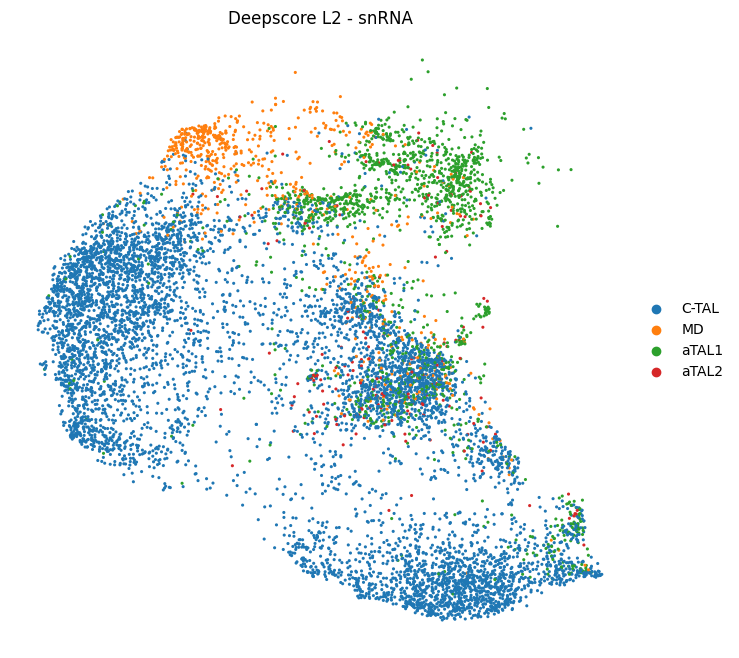

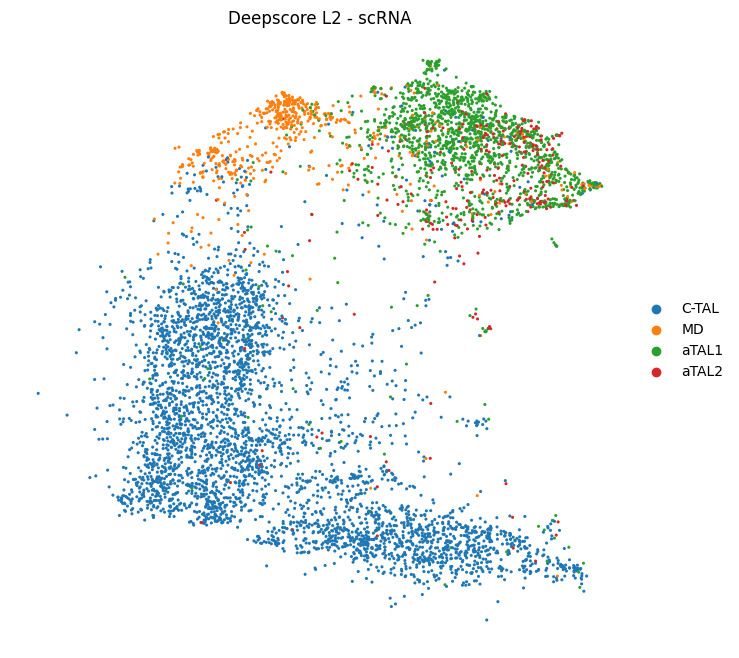

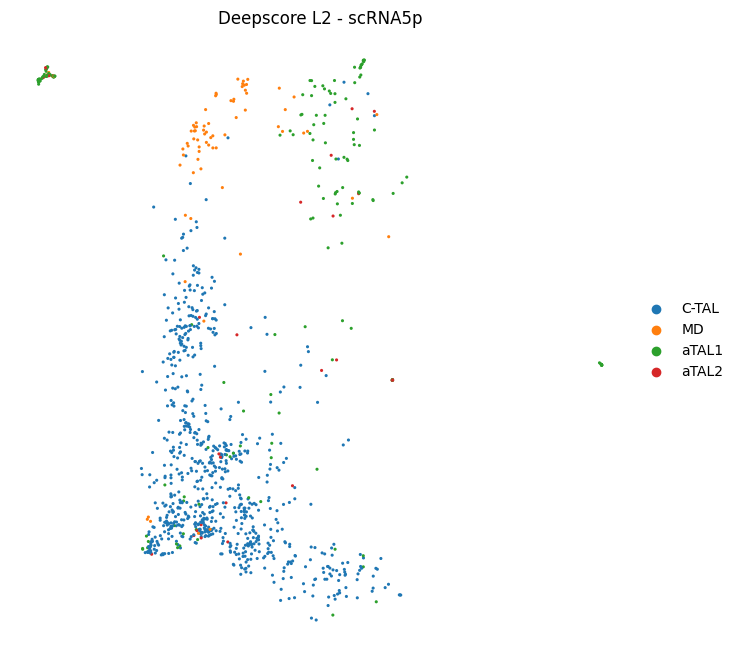

In [29]:

for batch in ['snRNA','scRNA','scRNA5p']:
    sc.pl.umap(adata[adata.obs['batch']==batch], color = ['Deepscore_HCA_l3_Clean'], ncols=1, size = 20,frameon=False, show=False)
    plt.title(f'Deepscore L2 - {batch}')
    plt.savefig(f'figures/TAL1/Deepscore_l3_{batch}_Subset.png', dpi=300, bbox_inches='tight')



/home/macera/.conda/envs/scanpy_basic/lib/python3.9/site-packages/scanpy/plotting/_utils.py:465: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[value_to_plot + "_colors"] = colors_list
/home/macera/.conda/envs/scanpy_basic/lib/python3.9/site-packages/scanpy/plotting/_utils.py:465: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[value_to_plot + "_colors"] = colors_list
/home/macera/.conda/envs/scanpy_basic/lib/python3.9/site-packages/scanpy/plotting/_utils.py:465: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[value_to_plot + "_colors"] = colors_list


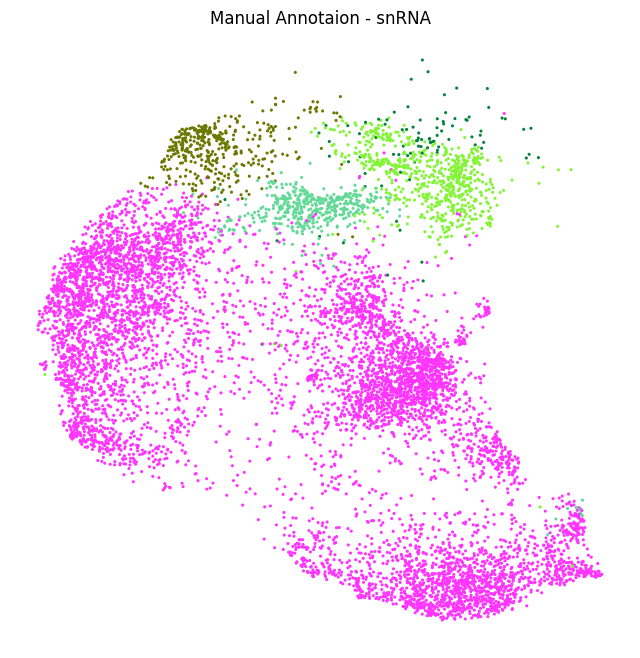

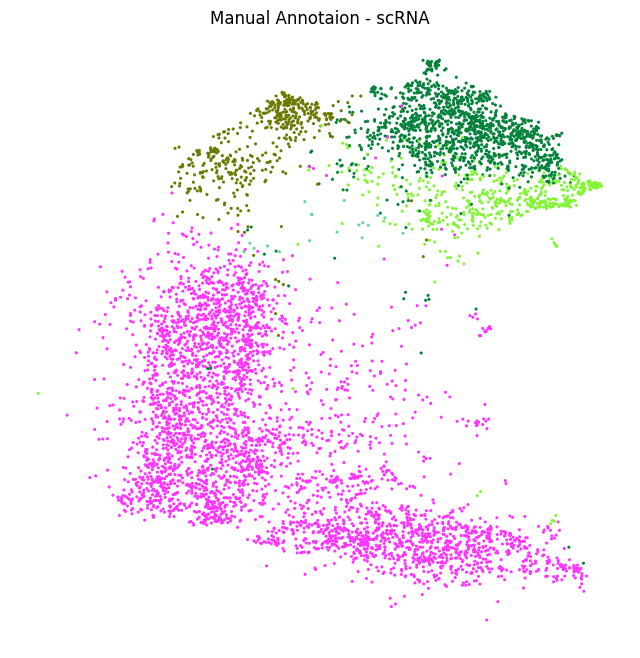

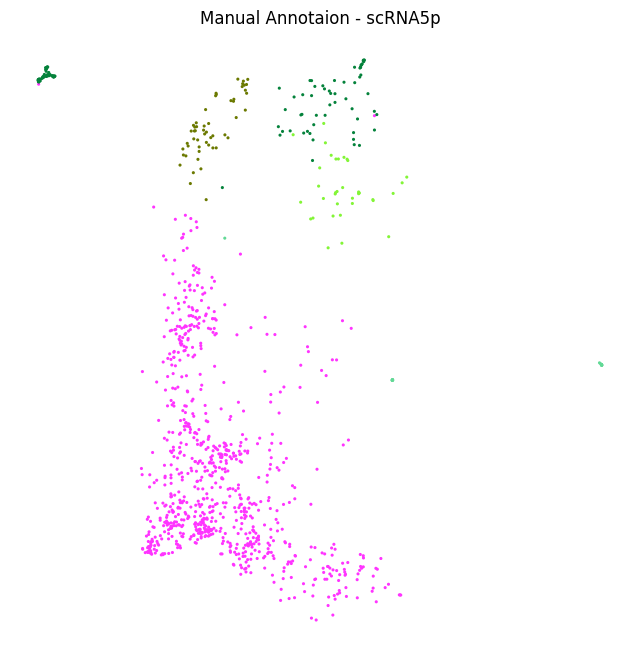

In [44]:
sc.pl.umap(adata, color = ['Manual_Annotation'], ncols=1, size = 20,frameon=False, show=False, palette = l3_colors)
for batch in ['snRNA','scRNA','scRNA5p']:
    sc.pl.umap(adata[adata.obs['batch']==batch], color = ['Manual_Annotation'], ncols=1, size = 20,frameon=False, show=False, palette = l3_colors, legend_loc='')
    plt.title(f'Manual Annotaion - {batch}')
    plt.savefig(f'figures/TAL1/Manual_Annotation_l3_{batch}_Subset.png', dpi=300, bbox_inches='tight')



## COMPUTE CLUSTERS MARKERS

In [7]:
adata.raw=None
sc.pp.normalize_total(adata)
sc.pp.log1p(adata)

In [89]:
sc.tl.rank_genes_groups(adata, groups=['aTAL1_0','aTAL1_1','aTAL1_2'],groupby='Manual_Annotation')

In [146]:
df = sc.get.rank_genes_groups_df(adata, group=None)
df = df[df['logfoldchanges']>0.25]

In [175]:
df[df['group']=='aTAL1_0'][0:20]

,group,names,scores,logfoldchanges,pvals,pvals_adj
0,aTAL1_0,WFDC2,91.404922,5.908248,0.0,0.0
1,aTAL1_0,B2M,89.812294,4.077370,0.0,0.0
2,aTAL1_0,S100A11,88.788864,4.617012,0.0,0.0
3,aTAL1_0,S100A6,84.201797,3.855152,0.0,0.0
4,aTAL1_0,TMSB10,79.891006,4.024242,0.0,0.0
5,aTAL1_0,HLA-B,79.415924,4.538771,0.0,0.0
6,aTAL1_0,ITM2B,78.498688,2.680017,0.0,0.0
7,aTAL1_0,ITM2C,77.883499,4.852221,0.0,0.0
8,aTAL1_0,PTMA,77.041389,3.180253,0.0,0.0
9,aTAL1_0,RPS27,74.298119,3.203673,0.0,0.0


In [149]:
df[df['group']=='aTAL1_1'].sort_values(by='pvals_adj', ascending=True)[0:30]


,group,names,scores,logfoldchanges,pvals,pvals_adj
38224,aTAL1_1,MALAT1,23.815479,1.206045,4.242300e-108,1.977533e-105
38225,aTAL1_1,VMP1,23.286989,2.082465,1.803216e-101,6.757464e-99
38226,aTAL1_1,PROM1,21.343081,2.495374,2.292406e-87,6.349632e-85
38227,aTAL1_1,ITGB6,20.414553,1.980101,3.572422e-81,8.697596e-79
38228,aTAL1_1,PAX8,20.000410,1.607432,1.635491e-78,3.699114e-76
38229,aTAL1_1,NEAT1,19.704563,1.213367,9.855078e-77,2.140344e-74
38230,aTAL1_1,KLF6,19.425234,1.807523,1.746271e-74,3.647512e-72
38231,aTAL1_1,PLEKHA1,18.968044,1.790647,1.862868e-71,3.614531e-69
38232,aTAL1_1,ITGB8,18.696211,1.595815,9.335649e-70,1.757861e-67
38233,aTAL1_1,LINC01320,18.477257,1.262811,1.413698e-68,2.597942e-66


In [98]:
df[df['group']=='aTAL1_2'][0:10]

,group,names,scores,logfoldchanges,pvals,pvals_adj
76448,aTAL1_2,MALAT1,37.473339,1.440005,6.951294e-176,2.952292e-172
76449,aTAL1_2,ABTB2,34.190285,4.288384,1.935177e-134,3.082091e-131
76450,aTAL1_2,VMP1,33.273430,3.185371,2.028158e-131,2.584144e-128
76451,aTAL1_2,MET,31.826876,4.124630,1.940447e-123,1.612427e-120
76452,aTAL1_2,SIK3,29.946741,2.487483,2.226395e-116,1.134690e-113
76453,aTAL1_2,AP1S3,29.853405,4.232275,4.097767e-114,1.779921e-111
76454,aTAL1_2,ZSWIM6,29.660053,3.054358,5.036959e-114,2.163289e-111
76455,aTAL1_2,CCSER1,29.097271,2.112725,1.059836e-116,5.549477e-114
76456,aTAL1_2,FNDC3A,29.036860,3.677017,1.865314e-110,6.855747e-108
76457,aTAL1_2,SAMD4A,28.729301,3.976839,5.724997e-109,1.989384e-106


In [209]:
sc.tl.rank_genes_groups(adata, layer='lognorm',groupby='Manual_Annotation')

In [210]:
df = sc.get.rank_genes_groups_df(adata, group=None)
df = df[df['logfoldchanges']>0.25]

In [214]:
df[df['group']=='MD'][0:20]

,group,names,scores,logfoldchanges,pvals,pvals_adj
38224,MD,BBOX1,36.257545,3.166195,1.696207e-182,4.322387e-179
38225,MD,ACSL4,34.622478,2.284183,7.397600e-174,1.413829e-170
38226,MD,MEST,26.288628,3.748777,1.097985e-114,7.494531e-112
38227,MD,PDK4,26.182272,1.882272,2.298528e-115,1.597435e-112
38228,MD,FGL2,25.819401,3.275792,1.032012e-111,6.801314e-109
38229,MD,ATP6V0E1,25.815678,1.935557,1.649766e-112,1.106328e-109
38230,MD,PAPPA2,25.583302,2.540750,6.521619e-111,4.225125e-108
38231,MD,ROBO2,24.833944,4.377501,4.286615e-105,2.520793e-102
38232,MD,CA4,24.563997,3.045350,1.500170e-103,8.432718e-101
38233,MD,CAMK2N1,24.346014,2.816940,3.373857e-102,1.816371e-99


In [215]:
df[df['group']=='C-TAL'][0:20]

,group,names,scores,logfoldchanges,pvals,pvals_adj
0,C-TAL,UMOD,122.007874,4.685194,0.0,0.0
1,C-TAL,EGF,113.750725,4.432745,0.0,0.0
2,C-TAL,KNG1,83.219528,3.094793,0.0,0.0
3,C-TAL,PTGER3,79.394386,3.011710,0.0,0.0
4,C-TAL,SLC12A1,71.434624,1.951291,0.0,0.0
5,C-TAL,CYFIP2,66.335403,2.261121,0.0,0.0
6,C-TAL,PLCL1,62.166008,2.525334,0.0,0.0
7,C-TAL,SLC16A7,60.081245,2.388283,0.0,0.0
8,C-TAL,CXCL12,58.907619,3.457671,0.0,0.0
9,C-TAL,NELL1,58.194214,3.276851,0.0,0.0


In [88]:
df['group'].unique()

['C-TAL', 'MD', 'aTAL1_0', 'aTAL1_1', 'aTAL1_2']
Categories (5, object): ['C-TAL', 'MD', 'aTAL1_0', 'aTAL1_1', 'aTAL1_2']

In [12]:
manual_markers_full = {
  #   'C-TAL':['UMOD','EGF','KNG1','CXCL12','TMEM207'],
  # 'MD':['BBOX1','MEST','FGL2','ROBO2','CA4','SOD3'],
  'aTAL1_0': ['WFDC2',
  'B2M',
  'TMSB10',
  'ITM2B','CLU','TACSTD2'],
  'aTAL1_1': ['NRP1','PROM1',
  'ITGB6',
  'KLF6','TPM1'],
 'aTAL1_2': ['ABTB2','ZSWIM6','VMP1',
  'MET',
  'AP1S3',
  'SAMD4A']}
manual_markers = { 'aTAL1_0': ['WFDC2',
  'B2M',
  'TMSB10',
  'ITM2B','CLU','TACSTD2']}
# ,
#   'aTAL1_1': ['NRP1','PROM1',
#   'ITGB6',
#   'KLF6','TPM1'],
#  'aTAL1_2': ['ABTB2','ZSWIM6','VMP1',
#   'MET',
#   'AP1S3',
#   'SAMD4A']}
 

In [39]:
adata.obs['batch'] = adata.obs['batch'].cat.reorder_categories(['scRNA3p', 'scRNA5p','snRNA'])
# adata.obs['Deepscore_HCA_l1_Clean'] = adata.obs['Deepscore_HCA_l1_Clean'].cat.reorder_categories(manual_markers.keys())
ann_batch_order = []
for i in adata.obs['Manual_Annotation'].cat.categories:
    for j in adata.obs['batch'].cat.categories:
        ann_batch_order.append(str(i)+' '+str(j))

adata.obs['AnnByBatch']= [str(i)+' '+str(j) for j,i in zip(adata.obs['batch'], adata.obs['Manual_Annotation'])]
adata.obs['AnnByBatch'] = adata.obs['AnnByBatch'].astype('category')
adata.obs['AnnByBatch'] = adata.obs['AnnByBatch'].cat.reorder_categories(ann_batch_order)

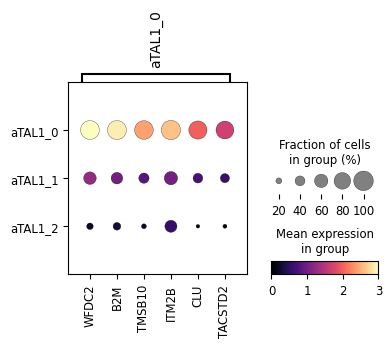

In [ ]:
dotplot = sc.pl.dotplot(adata[adata.obs['Manual_Annotation'].isin(manual_markers_full.keys())], var_names=manual_markers, groupby='Manual_Annotation', show=False, vmin=-0, vmax=3,figsize=(4,2.5), cmap='magma')
plt.gca().set_yticklabels(plt.gca().get_yticklabels(), rotation=50)
plt.savefig('figures/dotplots/aTAL1_0_Dotplot_Markers.png', dpi = 500, bbox_inches='tight')

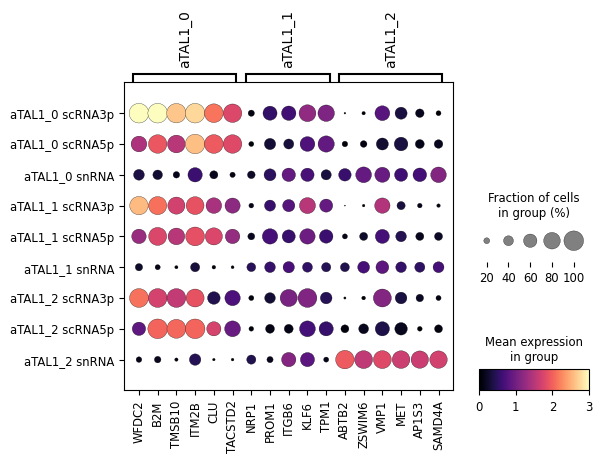

In [46]:
dotplot = sc.pl.dotplot(adata[adata.obs['Manual_Annotation'].isin(manual_markers_full.keys())], var_names=manual_markers_full, groupby='AnnByBatch', show=False, vmin=-0, vmax=3,figsize=(6,4), cmap='magma')
plt.gca().set_yticklabels(plt.gca().get_yticklabels(), rotation=50)
plt.savefig('figures/dotplots/aTAL1_Subclusters_Dotplot_Markers.png', dpi = 500, bbox_inches='tight')

In [37]:
adata

AnnData object with n_obs × n_vars = 16301 × 38224
    obs: 'sample', 'batch', 'n_counts', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_rb', 'pct_counts_rb', 'Deepscore_external', 'Doublet_Detection_doublets_scRNA', 'Doublet_Detection_doublets_score_scRNA', 'Doublet_Detection_doublets_scRNA5p', 'Doublet_Detection_doublets_score_scRNA5p', 'AMULET_doublets', 'AMULET_pval', 'AMULET_qval', 'Doublet_Detection_doublets_snRNA', 'Doublet_Detection_doublets_score_snRNA', 'In_final_obj', 'Deepscore', 'Technology', 'Suspension_type', 'Study', 'Donor_id', 'Deepscore_HCA_l1_Clean', 'Deepscore_HCA_l1_full', 'Deepscore_HCA_l1_Clean_score', 'Deepscore_HCA_l1_Full', 'Deepscore_HCA_l1_Full_score', 'Deepscore_HCA_l3_Clean', 'Deepscore_HCA_l3_Clean_score', 'Deepscore_HCA_l3_Full', 'Deepscore_HCA_l3_Full_score', 'Deepscore_Muto', 'Deepscore_Muto_score', 'leiden_scVI_0.3', 'leiden_scVI_1.4', 'leiden_scVI_2', 'leiden_scVI_6', 'leiden_scVI_10', 'Manual_Annotation_l1',

In [36]:
dotplot = sc.pl.dotplot(adata[adata.obs['Manual_Annotation'].isin(manual_markers_full.keys())], var_names=manual_markers_full, groupby='AnnbyBatch', show=False, vmin=-0, vmax=3,figsize=(4,2.5), cmap='magma')
plt.gca().set_yticklabels(plt.gca().get_yticklabels(), rotation=50)
plt.savefig('figures/dotplots/aTAL1_0_Dotplot_Markers.png', dpi = 500, bbox_inches='tight')

ValueError: groupby has to be a valid observation. Given AnnbyBatch, is not in observations: ['sample', 'batch', 'n_counts', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_rb', 'pct_counts_rb', 'Deepscore_external', 'Doublet_Detection_doublets_scRNA', 'Doublet_Detection_doublets_score_scRNA', 'Doublet_Detection_doublets_scRNA5p', 'Doublet_Detection_doublets_score_scRNA5p', 'AMULET_doublets', 'AMULET_pval', 'AMULET_qval', 'Doublet_Detection_doublets_snRNA', 'Doublet_Detection_doublets_score_snRNA', 'In_final_obj', 'Deepscore', 'Technology', 'Suspension_type', 'Study', 'Donor_id', 'Deepscore_HCA_l1_Clean', 'Deepscore_HCA_l1_full', 'Deepscore_HCA_l1_Clean_score', 'Deepscore_HCA_l1_Full', 'Deepscore_HCA_l1_Full_score', 'Deepscore_HCA_l3_Clean', 'Deepscore_HCA_l3_Clean_score', 'Deepscore_HCA_l3_Full', 'Deepscore_HCA_l3_Full_score', 'Deepscore_Muto', 'Deepscore_Muto_score', 'leiden_scVI_0.3', 'leiden_scVI_1.4', 'leiden_scVI_2', 'leiden_scVI_6', 'leiden_scVI_10', 'Manual_Annotation_l1', 'Manual_Annotation_l2', 'leiden', 'leiden_r2', 'Manual_Annotation', 'Manual_Annotaiton', 'batch_highlight', 'Manual_Annotation_snRNA', 'Manual_Annotation_scRNA', 'Manual_Annotation_scRNA5p']

In [10]:
adata.obs['batch'] = adata.obs['batch'].cat.reorder_categories(['scRNA', 'scRNA5p','snRNA'])
# adata.obs['Deepscore_HCA_l1_Clean'] = adata.obs['Deepscore_HCA_l1_Clean'].cat.reorder_categories(manual_markers.keys())
ann_batch_order = []
for i in adata.obs['Manual_Annotation'].cat.categories:
    for j in adata.obs['batch'].cat.categories:
        ann_batch_order.append(str(i)+' '+str(j))

In [11]:
adata.obs['AnnByBatch']= [str(i)+' '+str(j) for j,i in zip(adata.obs['batch'], adata.obs['Manual_Annotation'])]
adata.obs['AnnByBatch'] = adata.obs['AnnByBatch'].astype('category')
adata.obs['AnnByBatch'] = adata.obs['AnnByBatch'].cat.reorder_categories(ann_batch_order)


In [115]:
sc.pl.dotplot??

Signature:
sc.pl.dotplot(
    adata: 'AnnData',
    var_names: '_VarNames | Mapping[str, _VarNames]',
    groupby: 'str | Sequence[str]',
    *,
    use_raw: 'bool | None' = None,
    log: 'bool' = False,
    num_categories: 'int' = 7,
    expression_cutoff: 'float' = 0.0,
    mean_only_expressed: 'bool' = False,
    cmap: 'str' = 'Reds',
    dot_max: 'float | None' = None,
    dot_min: 'float | None' = None,
    standard_scale: "Literal['var', 'group'] | None" = None,
    smallest_dot: 'float | None' = 0.0,
    title: 'str | None' = None,
    colorbar_title: 'str | None' = 'Mean expression\nin group',
    size_title: 'str | None' = 'Fraction of cells\nin group (%)',
    figsize: 'tuple[float, float] | None' = None,
    dendrogram: 'bool | str' = False,
    gene_symbols: 'str | None' = None,
    var_group_positions: 'Sequence[tuple[int, int]] | None' = None,
    var_group_labels: 'Sequence[str] | None' = None,
    var_group_rotation: 'float | None' = None,
    layer: 'str | None' = Non

In [124]:
adata = adata[adata.obs['Manual_Annotation'].isin(manual_markers.keys())]

In [141]:
adata

AnnData object with n_obs × n_vars = 3385 × 38224
    obs: 'sample', 'batch', 'n_counts', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_rb', 'pct_counts_rb', 'Deepscore_external', 'Doublet_Detection_doublets_scRNA', 'Doublet_Detection_doublets_score_scRNA', 'Doublet_Detection_doublets_scRNA5p', 'Doublet_Detection_doublets_score_scRNA5p', 'AMULET_doublets', 'AMULET_pval', 'AMULET_qval', 'Doublet_Detection_doublets_snRNA', 'Doublet_Detection_doublets_score_snRNA', 'In_final_obj', 'Deepscore', 'Technology', 'Suspension_type', 'Study', 'Donor_id', 'Deepscore_HCA_l1_Clean', 'Deepscore_HCA_l1_full', 'Deepscore_HCA_l1_Clean_score', 'Deepscore_HCA_l1_Full', 'Deepscore_HCA_l1_Full_score', 'Deepscore_HCA_l3_Clean', 'Deepscore_HCA_l3_Clean_score', 'Deepscore_HCA_l3_Full', 'Deepscore_HCA_l3_Full_score', 'Deepscore_Muto', 'Deepscore_Muto_score', 'leiden_scVI_0.3', 'leiden_scVI_1.4', 'leiden_scVI_2', 'leiden_scVI_6', 'leiden_scVI_10', 'Manual_Annotation_l1', 

In [171]:
adata.X

matrix([[0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.],
        ...,
        [0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.]], dtype=float32)

In [13]:
adata.X = adata.layers['lognorm'].copy()
sc.pp.scale(adata)
adata.layers['scale'] = adata.X.copy()

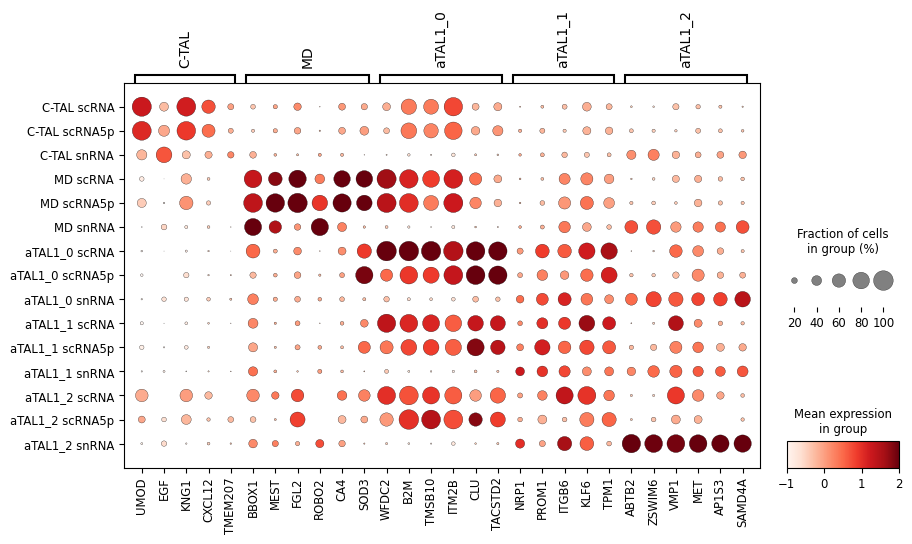

In [221]:
sc.pl.dotplot(adata, var_names=manual_markers_full, groupby='AnnByBatch', show=False, layer='scale', vmin=-1, vmax=2,figsize=(10,5))
plt.savefig('figures/dotplots/TAL_Dotplot_Manual_split_byTech_FullData_FullMarkers.png', dpi = 500, bbox_inches='tight')

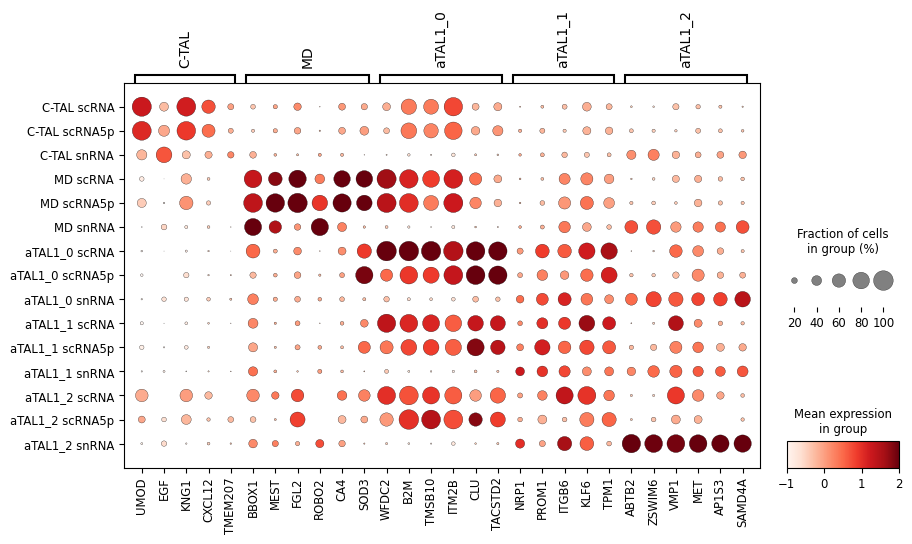

In [ ]:
sc.pl.dotplot(adata, var_names=manual_markers_full, groupby='AnnByBatch', show=False, layer='scale', vmin=-1, vmax=2,figsize=(10,5))
plt.savefig('figures/dotplots/TAL_Dotplot_Manual_split_byTech_FullData_FullMarkers.png', dpi = 500, bbox_inches='tight')

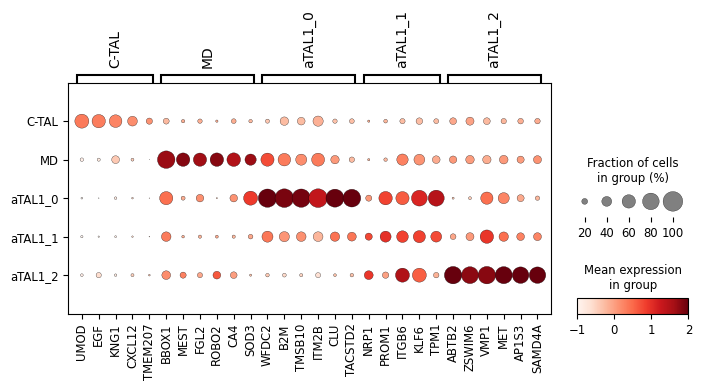

In [225]:
sc.pl.dotplot(adata, var_names=manual_markers_full, groupby='Manual_Annotation', show=False, layer='scale', vmin=-1, vmax=2,figsize=(8,3))
plt.savefig('figures/dotplots/TAL_Dotplot_Manual_FullData_FullMarkers.png', dpi = 500, bbox_inches='tight')

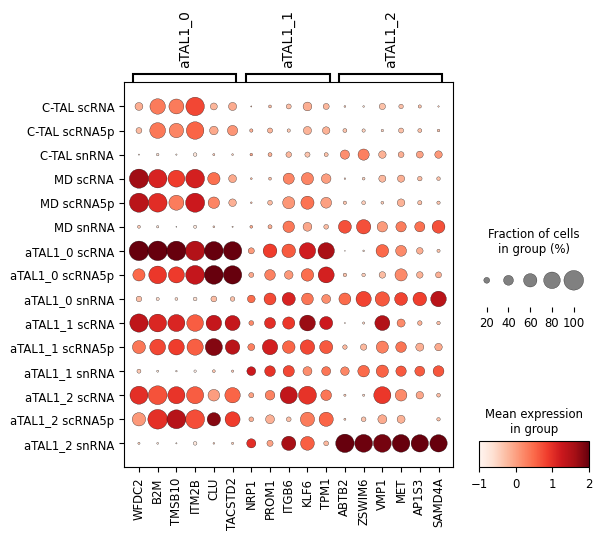

In [223]:
sc.pl.dotplot(adata, var_names=manual_markers, groupby='AnnByBatch', show=False, layer='scale', vmin=-1, vmax=2,figsize=(6,5))
plt.savefig('figures/dotplots/TAL_Dotplot_Manual_split_byTech_FullData.png', dpi = 500, bbox_inches='tight')

In [8]:
adata

AnnData object with n_obs × n_vars = 16301 × 38224
    obs: 'sample', 'batch', 'n_counts', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_rb', 'pct_counts_rb', 'Deepscore_external', 'Doublet_Detection_doublets_scRNA', 'Doublet_Detection_doublets_score_scRNA', 'Doublet_Detection_doublets_scRNA5p', 'Doublet_Detection_doublets_score_scRNA5p', 'AMULET_doublets', 'AMULET_pval', 'AMULET_qval', 'Doublet_Detection_doublets_snRNA', 'Doublet_Detection_doublets_score_snRNA', 'In_final_obj', 'Deepscore', 'Technology', 'Suspension_type', 'Study', 'Donor_id', 'Deepscore_HCA_l1_Clean', 'Deepscore_HCA_l1_full', 'Deepscore_HCA_l1_Clean_score', 'Deepscore_HCA_l1_Full', 'Deepscore_HCA_l1_Full_score', 'Deepscore_HCA_l3_Clean', 'Deepscore_HCA_l3_Clean_score', 'Deepscore_HCA_l3_Full', 'Deepscore_HCA_l3_Full_score', 'Deepscore_Muto', 'Deepscore_Muto_score', 'leiden_scVI_0.3', 'leiden_scVI_1.4', 'leiden_scVI_2', 'leiden_scVI_6', 'leiden_scVI_10', 'Manual_Annotation_l1',

In [17]:
sc.pl.dotplot??

Signature:
sc.pl.dotplot(
    adata: 'AnnData',
    var_names: '_VarNames | Mapping[str, _VarNames]',
    groupby: 'str | Sequence[str]',
    *,
    use_raw: 'bool | None' = None,
    log: 'bool' = False,
    num_categories: 'int' = 7,
    expression_cutoff: 'float' = 0.0,
    mean_only_expressed: 'bool' = False,
    cmap: 'str' = 'Reds',
    dot_max: 'float | None' = None,
    dot_min: 'float | None' = None,
    standard_scale: "Literal['var', 'group'] | None" = None,
    smallest_dot: 'float | None' = 0.0,
    title: 'str | None' = None,
    colorbar_title: 'str | None' = 'Mean expression\nin group',
    size_title: 'str | None' = 'Fraction of cells\nin group (%)',
    figsize: 'tuple[float, float] | None' = None,
    dendrogram: 'bool | str' = False,
    gene_symbols: 'str | None' = None,
    var_group_positions: 'Sequence[tuple[int, int]] | None' = None,
    var_group_labels: 'Sequence[str] | None' = None,
    var_group_rotation: 'float | None' = None,
    layer: 'str | None' = Non

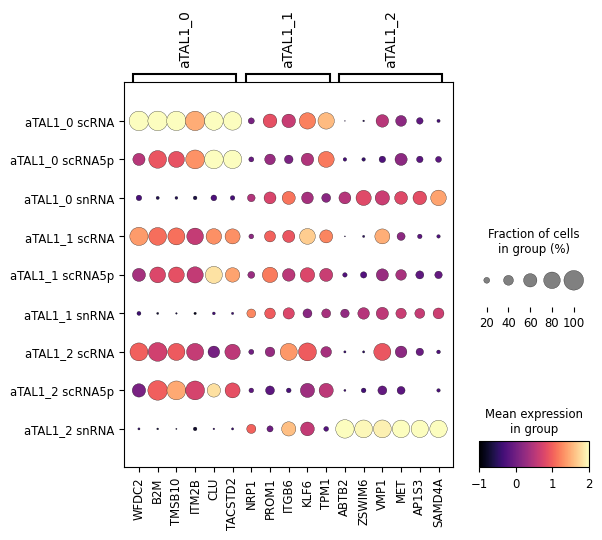

In [28]:
dotplot = sc.pl.dotplot(adata[adata.obs['Manual_Annotation'].isin(manual_markers.keys())], var_names=manual_markers, groupby='AnnByBatch', show=False, layer='scale', vmin=-1, vmax=2,figsize=(6,5), cmap='magma')
plt.gca().set_yticklabels(plt.gca().get_yticklabels(), rotation=50)
plt.savefig('figures/dotplots/TAL_Dotplot_Manual_split_byTech_aTAL1.png', dpi = 500, bbox_inches='tight')

In [201]:
manual_markers_ = manual_markers
manual_markers_.pop('aTAL1_1')

['NRP1', 'PROM1', 'ITGB6', 'KLF6', 'TPM1']

In [203]:
manual_markers_

{'aTAL1_0': ['WFDC2', 'B2M', 'TMSB10', 'ITM2B', 'CLU', 'TACSTD2'],
 'aTAL1_2': ['ABTB2', 'ZSWIM6', 'VMP1', 'MET', 'AP1S3', 'SAMD4A']}

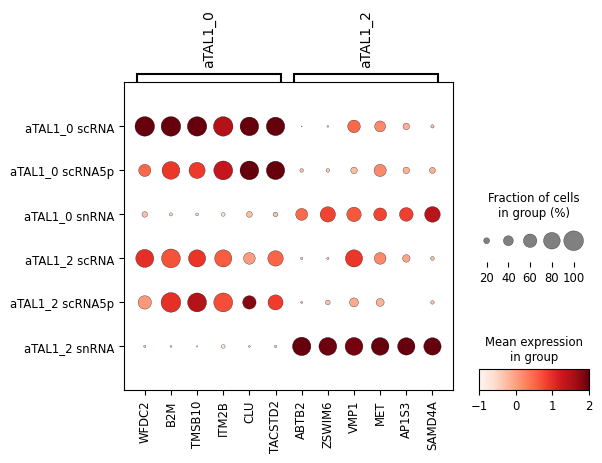

In [227]:
sc.pl.dotplot(adata[adata.obs['Manual_Annotation'].isin(['aTAL1_0','aTAL1_2'])], var_names=manual_markers_, groupby='AnnByBatch', show=False, layer='scale',vmin=-1, vmax=2,figsize=(6,4))
plt.savefig('figures/dotplots/TAL_Dotplot_Manual_split_byTech_aTAL1_Cleaner.png', dpi = 500, bbox_inches='tight')

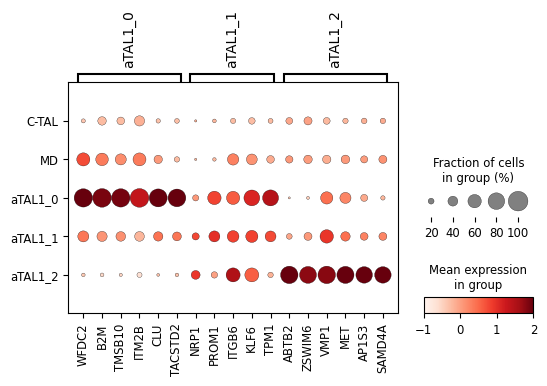

In [228]:
sc.pl.dotplot(adata, var_names=manual_markers, groupby='Manual_Annotation', show=False, layer='scale', vmin=-1, vmax=2,figsize=(6,3))
plt.savefig('figures/dotplots/TAL_Dotplot_Manual_Full.png', dpi = 500, bbox_inches='tight')

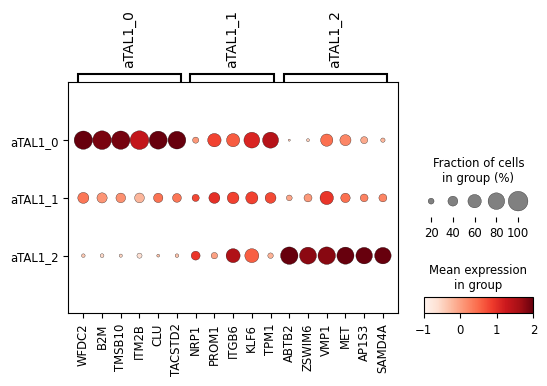

In [229]:
sc.pl.dotplot(adata[adata.obs['Manual_Annotation'].isin(manual_markers.keys())], var_names=manual_markers, groupby='Manual_Annotation', show=False, layer='scale', vmin=-1, vmax=2,figsize=(6,3))
plt.savefig('figures/dotplots/TAL_Dotplot_Manual_aTAL1.png', dpi = 500, bbox_inches='tight')

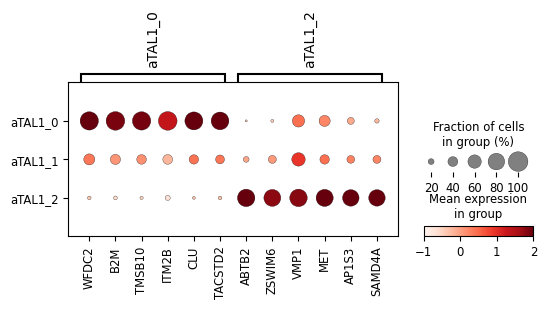

In [230]:
sc.pl.dotplot(adata[adata.obs['Manual_Annotation'].isin(manual_markers.keys())], var_names=manual_markers_, groupby='Manual_Annotation', show=False, layer='scale', vmin=-1, vmax=2,figsize=(6,2))
plt.savefig('figures/dotplots/TAL_Dotplot_Manual_aTAL1_Cleaner.png', dpi = 500, bbox_inches='tight')

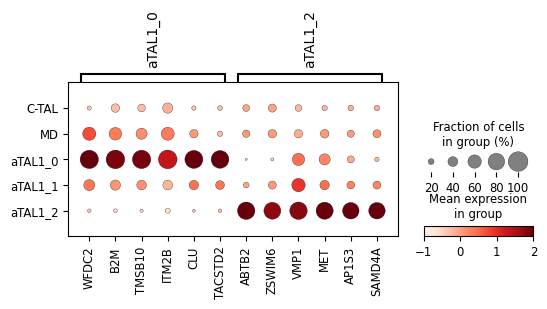

In [231]:
sc.pl.dotplot(adata, var_names=manual_markers_, groupby='Manual_Annotation', show=False, layer='scale', vmin=-1, vmax=2,figsize=(6,2))
plt.savefig('figures/dotplots/TAL_Dotplot_Manual_Cleaner.png', dpi = 500, bbox_inches='tight')

In [ ]:
df = sc.get.rank_genes_groups_df(adata, group=None)
df.to_csv('csv/DE_TAL_RECLUSTERED.csv')

In [88]:
sc.tl.rank_genes_groups(adata, groupby='leiden_r2')

In [89]:
df = sc.get.rank_genes_groups_df(adata, group=None)
df.to_csv('csv/DE_TAL_RECLUSTERED_r2.csv')

In [22]:
df = pd.read_csv('csv/DE_TAL_RECLUSTERED_r2.csv', index_col=0)

/tmp/ipykernel_13301/1663567349.py:1: DtypeWarning: Columns (1) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv('csv/DE_TAL_RECLUSTERED_r2.csv', index_col=0)


In [125]:
df[df['group']=='2_0'][0:50]['names'].tolist()

['WFDC2',
 'B2M',
 'S100A11',
 'ITM2C',
 'S100A6',
 'TMSB10',
 'HLA-B',
 'PTMA',
 'ITM2B',
 'RPS27',
 'FTH1',
 'CD24',
 'CD63',
 'HLA-A',
 'RPL10',
 'RPLP1',
 'EEF1A1',
 'RPL41',
 'RPS27A',
 'RPL3',
 'CLU',
 'TACSTD2',
 'RPS12',
 'GSTP1',
 'CD9',
 'HLA-C',
 'RPS21',
 'ACTG1',
 'MYL6',
 'RPL34',
 'RPS8',
 'TPT1',
 'RPL15',
 'RPS24',
 'ANXA2',
 'CST3',
 'RPS19',
 'RPL30',
 'KRT7',
 'RPL32',
 'RPL13',
 'RPS9',
 'LAPTM4A',
 'RPS18',
 'RPL28',
 'RPS23',
 'RPS14',
 'RPS28',
 'RPS3A',
 'TMSB4X']

In [132]:
adata[adata.obs['leiden_r2']=='2_0'].obs.groupby(['leiden_r2'])['sample'].value_counts()

/tmp/ipykernel_30748/3161437051.py:1: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  adata[adata.obs['leiden_r2']=='2_0'].obs.groupby(['leiden_r2'])['sample'].value_counts()


leiden_r2  sample 
2_0        lib_68     1153
           lib_09       70
           lib_38       54
           lib_49       35
           lib_51       35
           lib_57       30
           lib_55       24
           lib_19       22
           lib_34       19
           lib_10       15
           lib_15       13
           lib_29       12
           lib_36       12
           lib_56       11
           lib_420       7
           lib_16        2
Name: count, dtype: int64

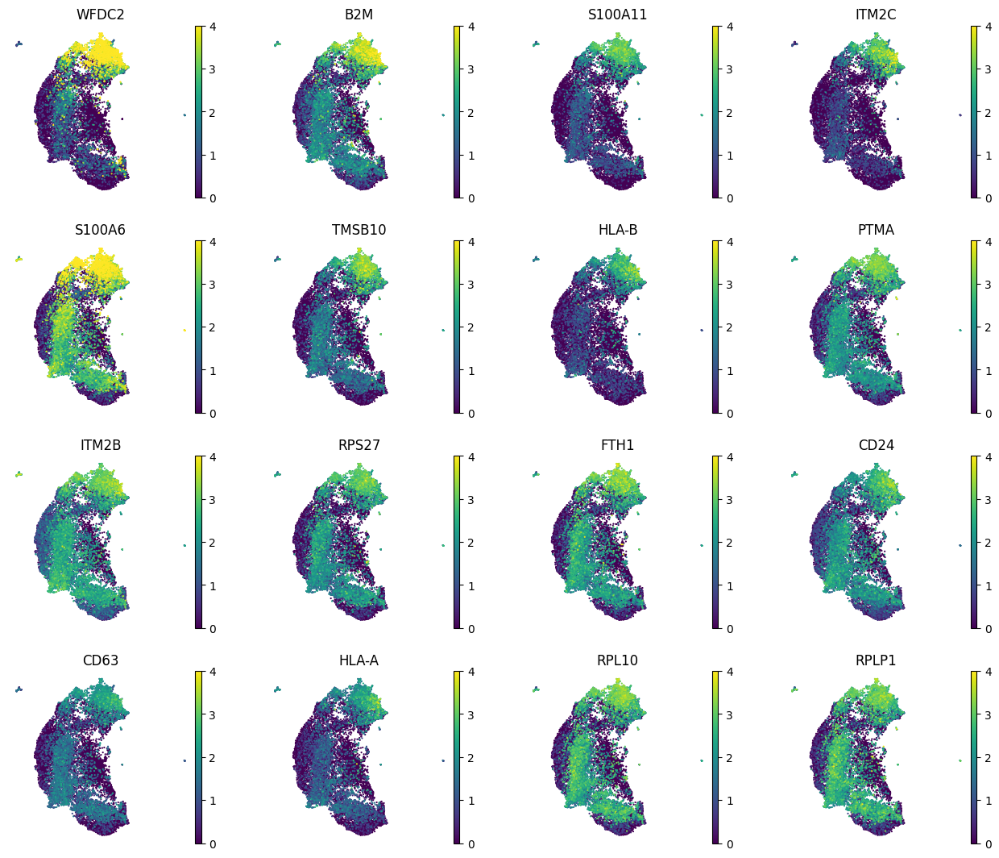

In [35]:
rcParams['figure.figsize'] = (3,3)

markers = []
for gene in df[df['group']=='2_0'][0:16]['names'].tolist():
    if gene.startswith('MT'):
        continue
    else:
        markers.append(gene)
sc.pl.umap(adata, color = markers, ncols=4, size = 10,frameon=False, show=False, vmin=0, vmax=4)
plt.savefig('figures/TAL1/cluster_2_0_Markers.png', dpi=300, bbox_inches='tight')
plt.savefig('figures/TAL1/cluster_2_0_Markers.pdf', dpi=300, bbox_inches='tight')

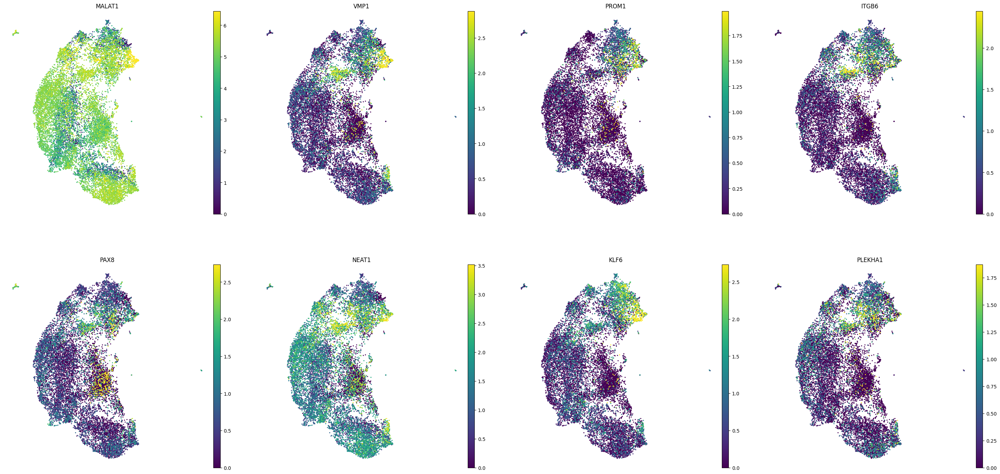

In [91]:
markers = []
for gene in df[df['group']=='2_1'][0:8]['names'].tolist():
    if gene.startswith('MT'):
        continue
    else:
        markers.append(gene)
sc.pl.umap(adata, color = markers, ncols=4,vmax='p99', size = 20,frameon=False, show=False)
plt.savefig('figures/TAL1/cluster_2_1_Markers.png', dpi=300, bbox_inches='tight')

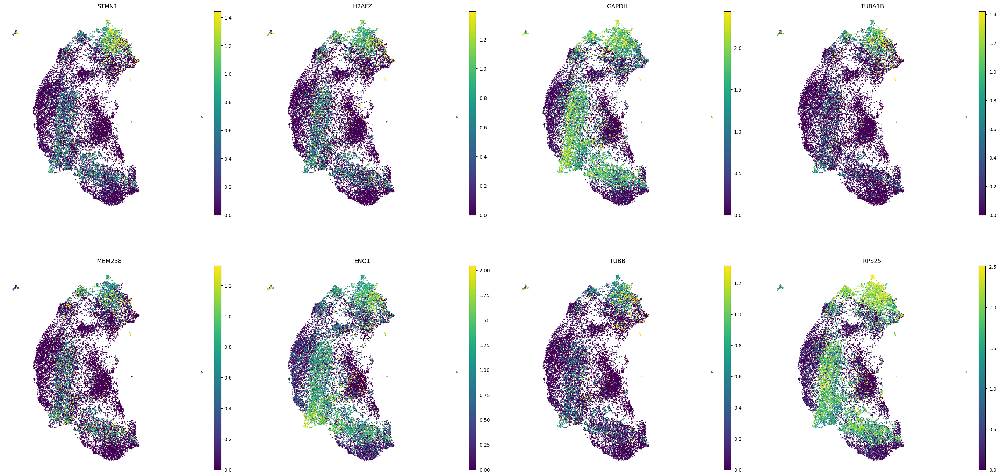

In [92]:
markers = []
for gene in df[df['group']=='2_2'][0:8]['names'].tolist():
    if gene.startswith('MT'):
        continue
    else:
        markers.append(gene)
sc.pl.umap(adata, color = markers, ncols=4,vmax='p99', size = 20,frameon=False, show=False)
plt.savefig('figures/TAL1/cluster_2_2_Markers.png', dpi=300, bbox_inches='tight')

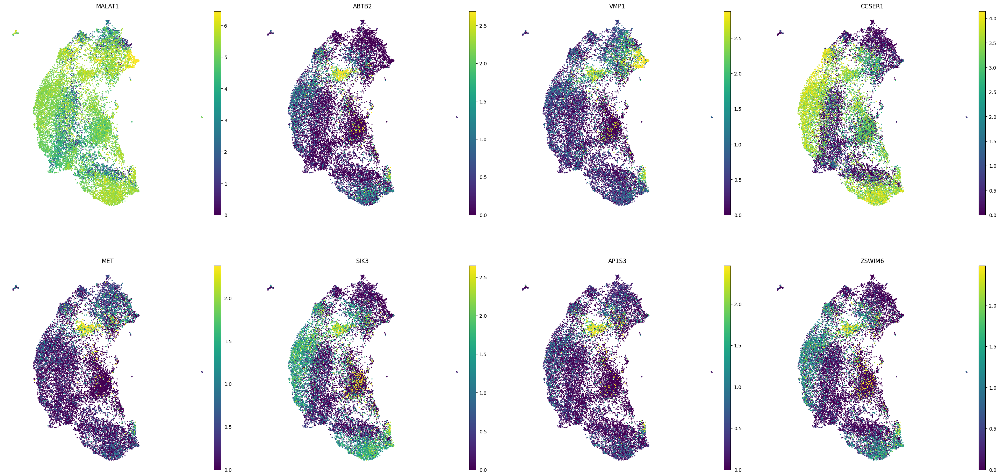

In [93]:
markers = []
for gene in df[df['group']=='6'][0:8]['names'].tolist():
    if gene.startswith('MT'):
        continue
    else:
        markers.append(gene)
sc.pl.umap(adata, color = markers, ncols=4,vmax='p99', size = 20,frameon=False, show=False)
plt.savefig('figures/TAL1/cluster_6_Markers.png', dpi=300, bbox_inches='tight')

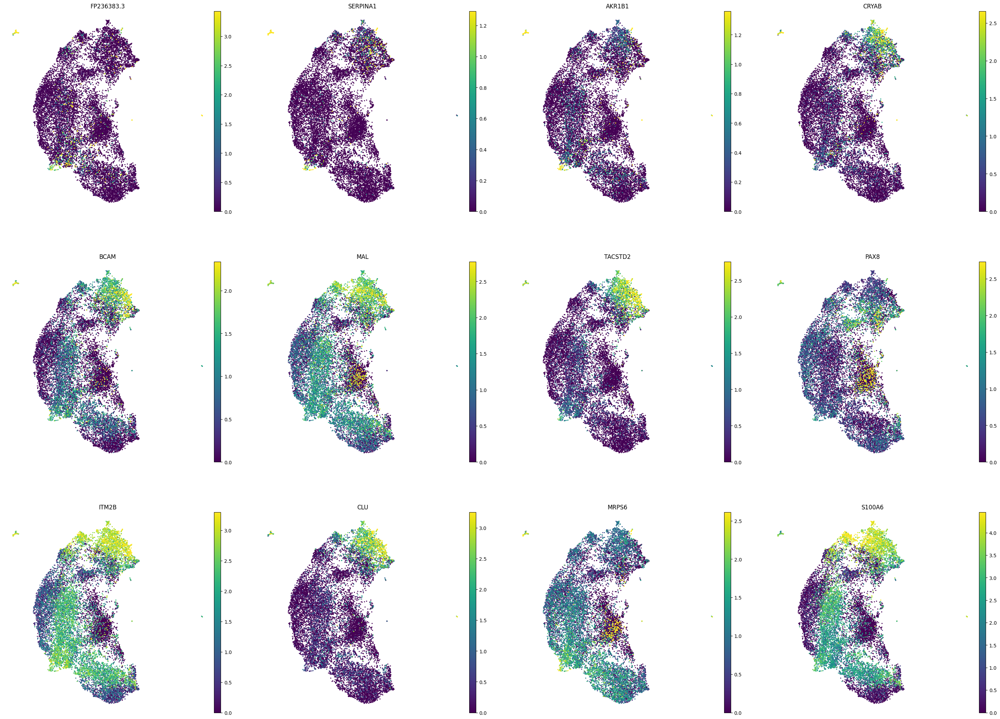

In [ ]:
markers = []
for gene in df[df['group']=='7'][0:20]['names'].tolist():
    if gene.startswith('MT'):
        continue
    else:
        markers.append(gene)
sc.pl.umap(adata, color = markers, ncols=4,vmax='p99', size = 20,frameon=False, show=False)
plt.savefig('figures/TAL1/cluster_7_Markers.png', dpi=300, bbox_inches='tight')

/tmp/ipykernel_30748/1153625729.py:21: FutureWarning: 

The `scale` parameter has been renamed and will be removed in v0.15.0. Pass `density_norm='width'` for the same effect.
  sns.violinplot(
/tmp/ipykernel_30748/1153625729.py:21: FutureWarning: 

The `bw` parameter is deprecated in favor of `bw_method`/`bw_adjust`.
Setting `bw_method=0.2`, but please see docs for the new parameters
and update your code. This will become an error in seaborn v0.15.0.

  sns.violinplot(


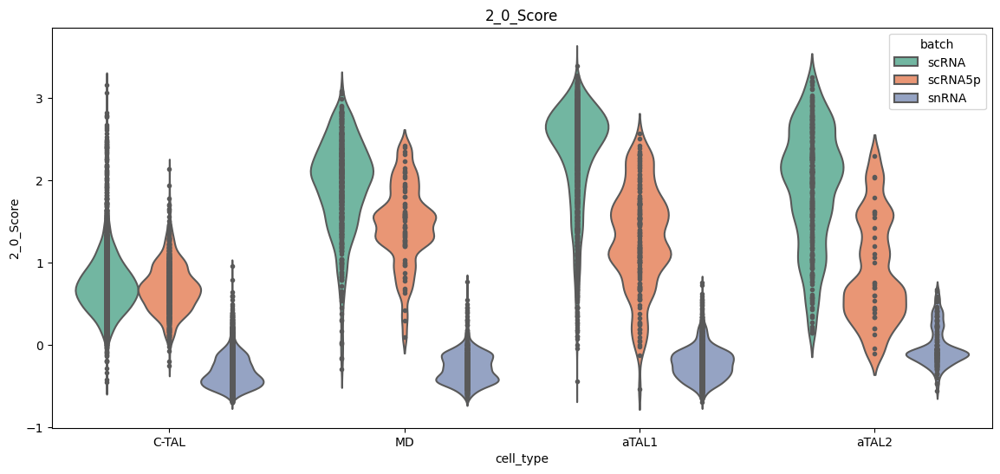

/tmp/ipykernel_30748/1153625729.py:21: FutureWarning: 

The `scale` parameter has been renamed and will be removed in v0.15.0. Pass `density_norm='width'` for the same effect.
  sns.violinplot(
/tmp/ipykernel_30748/1153625729.py:21: FutureWarning: 

The `bw` parameter is deprecated in favor of `bw_method`/`bw_adjust`.
Setting `bw_method=0.2`, but please see docs for the new parameters
and update your code. This will become an error in seaborn v0.15.0.

  sns.violinplot(


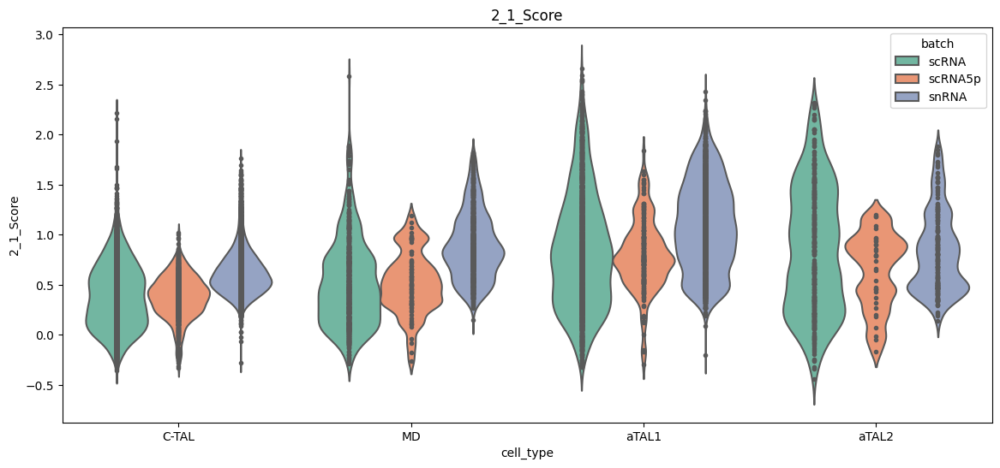

/tmp/ipykernel_30748/1153625729.py:21: FutureWarning: 

The `scale` parameter has been renamed and will be removed in v0.15.0. Pass `density_norm='width'` for the same effect.
  sns.violinplot(
/tmp/ipykernel_30748/1153625729.py:21: FutureWarning: 

The `bw` parameter is deprecated in favor of `bw_method`/`bw_adjust`.
Setting `bw_method=0.2`, but please see docs for the new parameters
and update your code. This will become an error in seaborn v0.15.0.

  sns.violinplot(


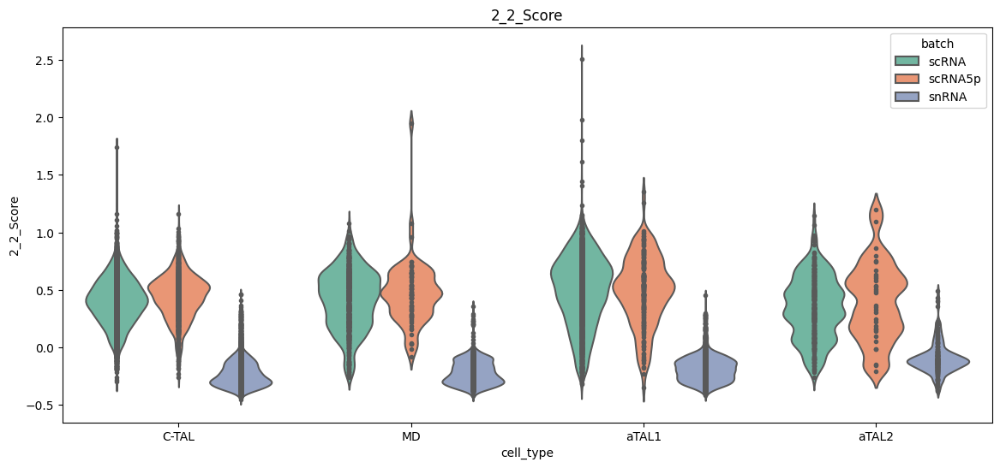

In [104]:

for cluster in ['2_0','2_1','2_2']:
    markers = []
    for gene in df[df['group']==cluster][0:8]['names'].tolist():
        if gene.startswith('MT'):
            continue
        else:
            markers.append(gene)


    sc.tl.score_genes(adata, markers, score_name=f'{cluster}_Score')


    data = pd.DataFrame({
    'cell_type': adata.obs['Deepscore_HCA_l3_Clean'],
    f'{cluster}_Score': adata.obs[f'{cluster}_Score'],
    'batch': adata.obs['batch']
        })

    # Create the violin plot
    plt.figure(figsize=(14, 6))  # Adjust figure size for clarity
    sns.violinplot(
        x='cell_type',            # The categorical variable
        y=f'{cluster}_Score',           # The numeric variable
        data=data,                # Your dataframe
        inner='point',         # Show quartiles within the violin
        scale='width',            # Equal width for violins regardless of sample size
        bw=0.2,                   # Smoothing parameter for the width of the violins
        linewidth=1.5,            # Thickness of the violin border
        palette="Set2",
        hue='batch')
    plt.title(f'{cluster}_Score')
    plt.savefig(f'figures/TAL1/Violin_{cluster}_score.png', dpi=250, bbox_inches='tight')
    plt.show()


# VIOLIN GENES

In [ ]:
def violin_gene(adata, gene, hue):
    data = pd.DataFrame({
    'cell_type': adata.obs['Deepscore_HCA_l3_Clean'],
    'gene_val': adata.X.toarray()[:,adata.var.index.get_loc(gene)],
    'batch': adata.obs[hue]
        })

    # Create the violin plot
    plt.figure(figsize=(7, 4))  # Adjust figure size for clarity
    sns.violinplot(
        x='cell_type',            # The categorical variable
        y='gene_val',           # The numeric variable
        data=data,                # Your dataframe
        # inner='point',         # Show quartiles within the violin
        scale='width',            # Equal width for violins regardless of sample size
        bw=0.2,                   # Smoothing parameter for the width of the violins
        linewidth=1.5,            # Thickness of the violin border
        palette="Set2",
        hue='batch')
    plt.title(gene)

/tmp/ipykernel_13301/561643038.py:10: FutureWarning: 

The `scale` parameter has been renamed and will be removed in v0.15.0. Pass `density_norm='width'` for the same effect.
  sns.violinplot(
/tmp/ipykernel_13301/561643038.py:10: FutureWarning: 

The `bw` parameter is deprecated in favor of `bw_method`/`bw_adjust`.
Setting `bw_method=0.2`, but please see docs for the new parameters
and update your code. This will become an error in seaborn v0.15.0.

  sns.violinplot(


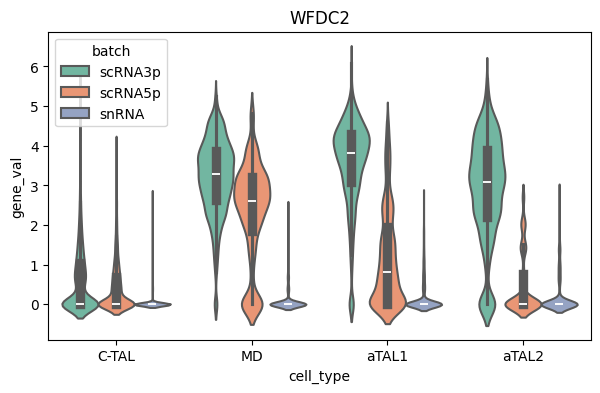

/tmp/ipykernel_13301/561643038.py:10: FutureWarning: 

The `scale` parameter has been renamed and will be removed in v0.15.0. Pass `density_norm='width'` for the same effect.
  sns.violinplot(
/tmp/ipykernel_13301/561643038.py:10: FutureWarning: 

The `bw` parameter is deprecated in favor of `bw_method`/`bw_adjust`.
Setting `bw_method=0.2`, but please see docs for the new parameters
and update your code. This will become an error in seaborn v0.15.0.

  sns.violinplot(


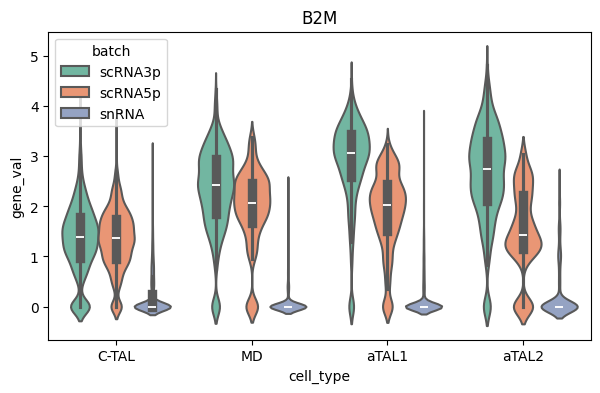

/tmp/ipykernel_13301/561643038.py:10: FutureWarning: 

The `scale` parameter has been renamed and will be removed in v0.15.0. Pass `density_norm='width'` for the same effect.
  sns.violinplot(
/tmp/ipykernel_13301/561643038.py:10: FutureWarning: 

The `bw` parameter is deprecated in favor of `bw_method`/`bw_adjust`.
Setting `bw_method=0.2`, but please see docs for the new parameters
and update your code. This will become an error in seaborn v0.15.0.

  sns.violinplot(


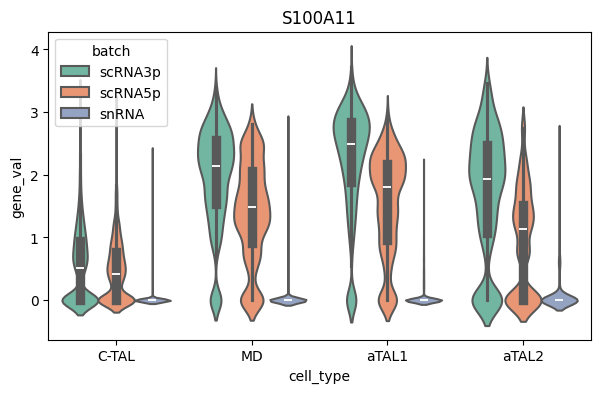

/tmp/ipykernel_13301/561643038.py:10: FutureWarning: 

The `scale` parameter has been renamed and will be removed in v0.15.0. Pass `density_norm='width'` for the same effect.
  sns.violinplot(
/tmp/ipykernel_13301/561643038.py:10: FutureWarning: 

The `bw` parameter is deprecated in favor of `bw_method`/`bw_adjust`.
Setting `bw_method=0.2`, but please see docs for the new parameters
and update your code. This will become an error in seaborn v0.15.0.

  sns.violinplot(


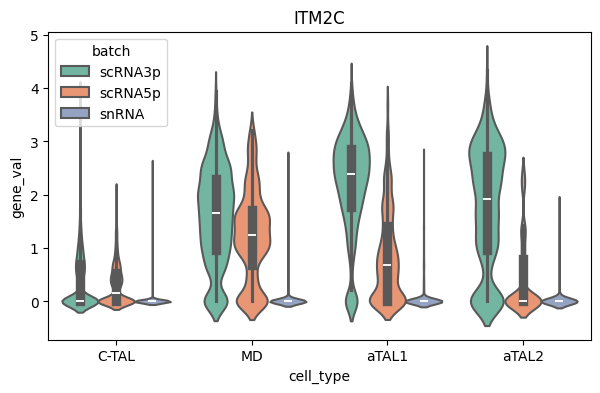

/tmp/ipykernel_13301/561643038.py:10: FutureWarning: 

The `scale` parameter has been renamed and will be removed in v0.15.0. Pass `density_norm='width'` for the same effect.
  sns.violinplot(
/tmp/ipykernel_13301/561643038.py:10: FutureWarning: 

The `bw` parameter is deprecated in favor of `bw_method`/`bw_adjust`.
Setting `bw_method=0.2`, but please see docs for the new parameters
and update your code. This will become an error in seaborn v0.15.0.

  sns.violinplot(


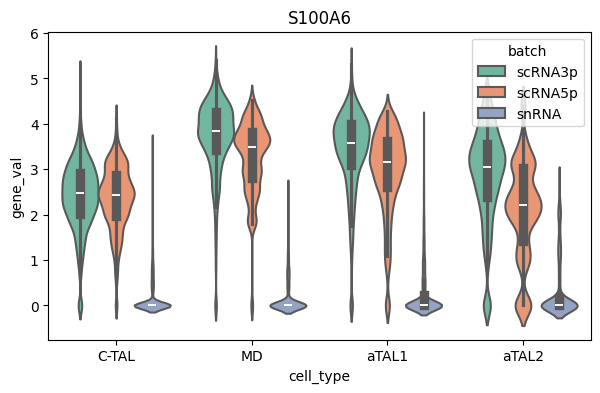

/tmp/ipykernel_13301/561643038.py:10: FutureWarning: 

The `scale` parameter has been renamed and will be removed in v0.15.0. Pass `density_norm='width'` for the same effect.
  sns.violinplot(
/tmp/ipykernel_13301/561643038.py:10: FutureWarning: 

The `bw` parameter is deprecated in favor of `bw_method`/`bw_adjust`.
Setting `bw_method=0.2`, but please see docs for the new parameters
and update your code. This will become an error in seaborn v0.15.0.

  sns.violinplot(


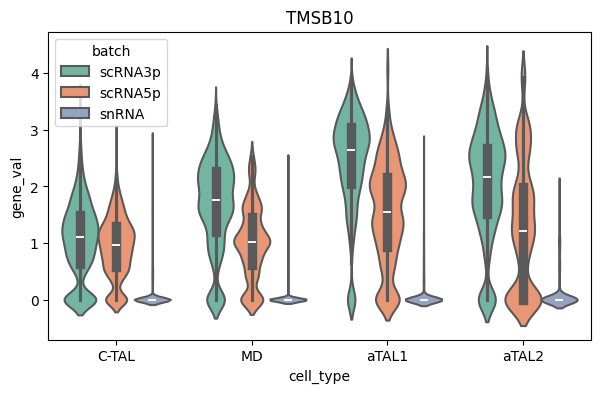

/tmp/ipykernel_13301/561643038.py:10: FutureWarning: 

The `scale` parameter has been renamed and will be removed in v0.15.0. Pass `density_norm='width'` for the same effect.
  sns.violinplot(
/tmp/ipykernel_13301/561643038.py:10: FutureWarning: 

The `bw` parameter is deprecated in favor of `bw_method`/`bw_adjust`.
Setting `bw_method=0.2`, but please see docs for the new parameters
and update your code. This will become an error in seaborn v0.15.0.

  sns.violinplot(


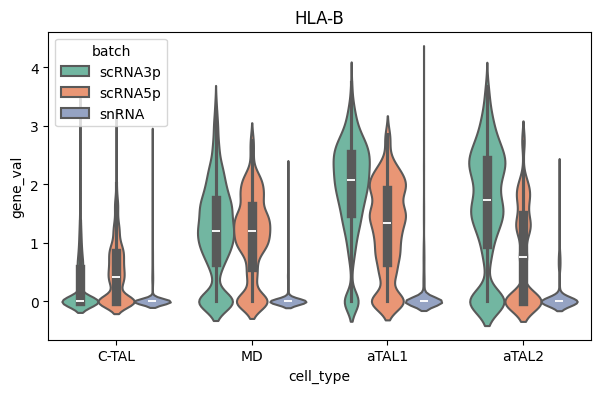

/tmp/ipykernel_13301/561643038.py:10: FutureWarning: 

The `scale` parameter has been renamed and will be removed in v0.15.0. Pass `density_norm='width'` for the same effect.
  sns.violinplot(
/tmp/ipykernel_13301/561643038.py:10: FutureWarning: 

The `bw` parameter is deprecated in favor of `bw_method`/`bw_adjust`.
Setting `bw_method=0.2`, but please see docs for the new parameters
and update your code. This will become an error in seaborn v0.15.0.

  sns.violinplot(


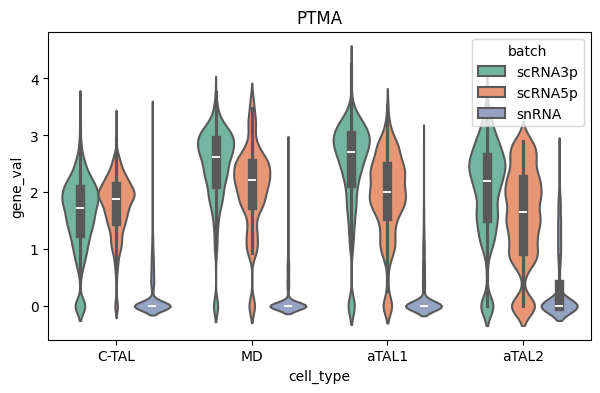

In [29]:
adata.obs['batch'] = adata.obs['batch'].cat.rename_categories(['scRNA3p', 'scRNA5p', 'snRNA'])

markers = []
for gene in df[df['group']=='2_0'][0:8]['names'].tolist():
    if gene.startswith('MT'):
        continue
    else:
        markers.append(gene)
for gene in markers:

    violin_gene(adata, gene= gene, hue='batch')
    plt.savefig(f'figures/TAL1/violin_{gene}_by_pop.png', dpi=600, bbox_inches='tight')
    plt.savefig(f'figures/TAL1/violin_{gene}_by_pop.pdf', dpi=600, bbox_inches='tight')
    plt.show()
